In [4]:
import yaml
import math
import numpy as np
import scanpy as sc

import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

In [4]:
sc.set_figure_params(dpi=80, dpi_save=300, frameon=False, vector_friendly=True)

In [2]:
visium_human_DLPFC =  ["../../data/visium/DLPFC/region_1/151674_labeled.h5ad","../../data/visium/DLPFC/region_1/151675_labeled.h5ad"]
merfish_mouse_hypothalamic =  ["../../data/merfish/hypothalamic/merfish_layer1_labeled.h5ad","../../data/merfish/hypothalamic/merfish_layer2_labeled.h5ad"]
stereo_mouse_embryo =  ["../../data/stereo_seq/counts/E15.5/count_E15.5_E1S1_filter_labeled.h5ad","../../data/stereo_seq/counts/E15.5/count_E15.5_E1S2_filter_labeled.h5ad"]

# Plot raw datasets

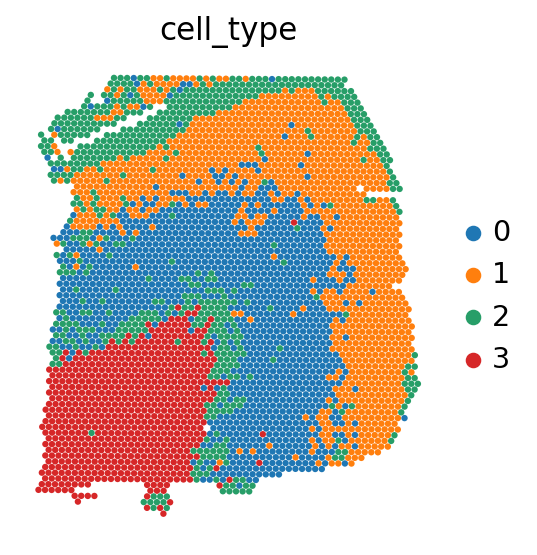

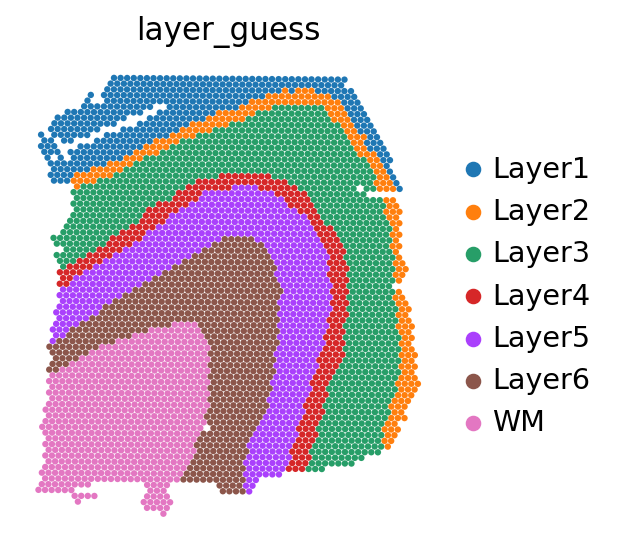

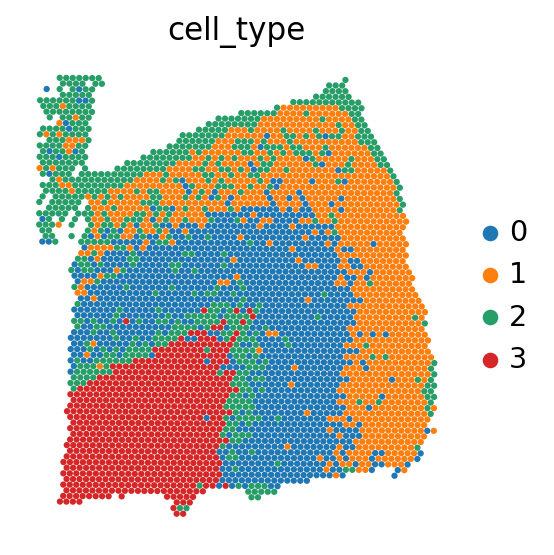

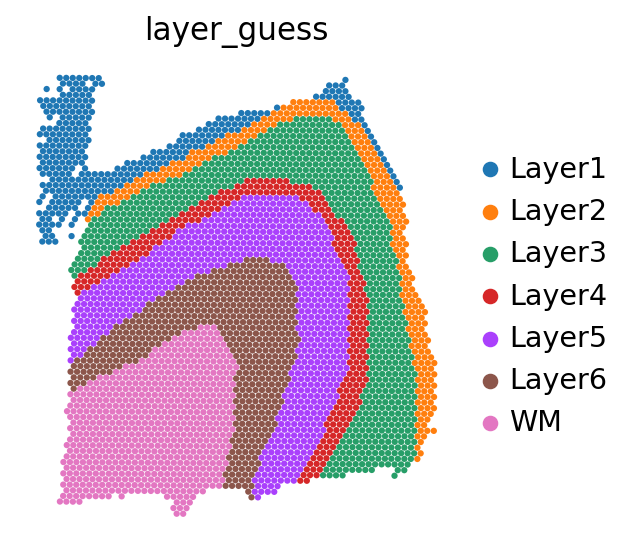

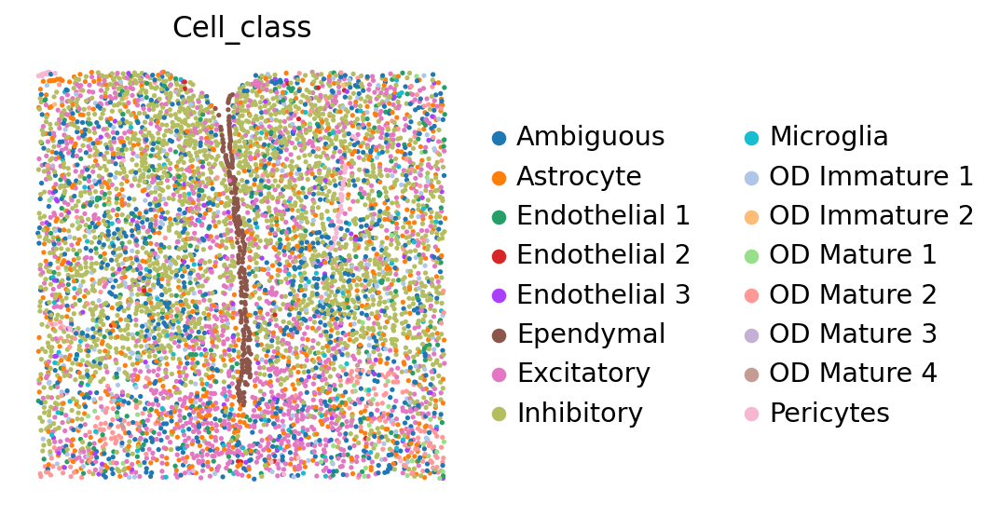

...

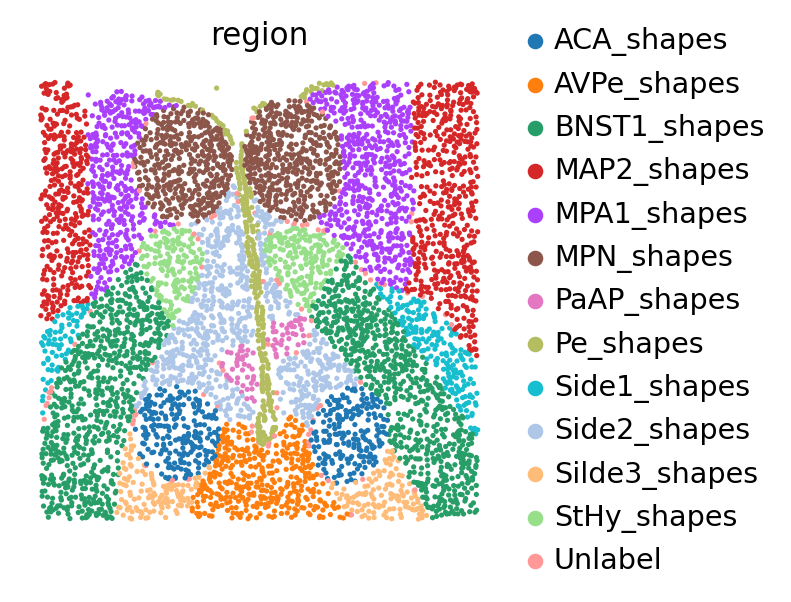

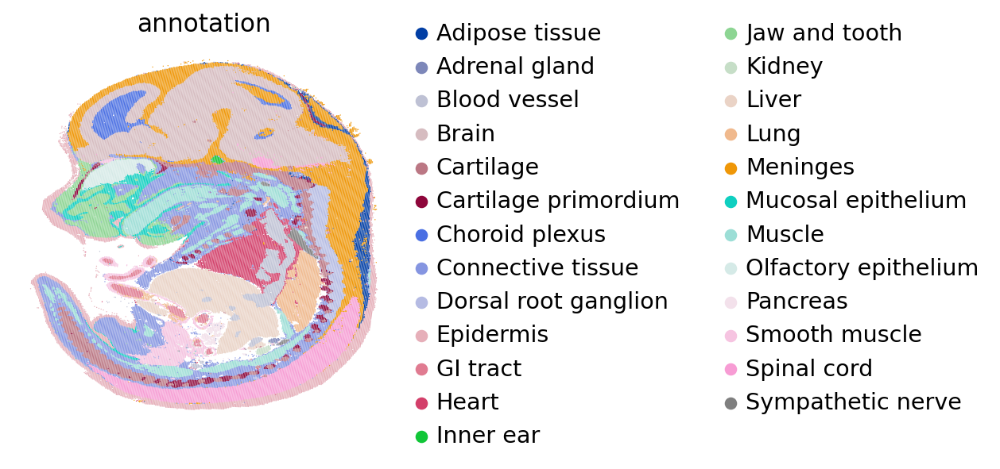

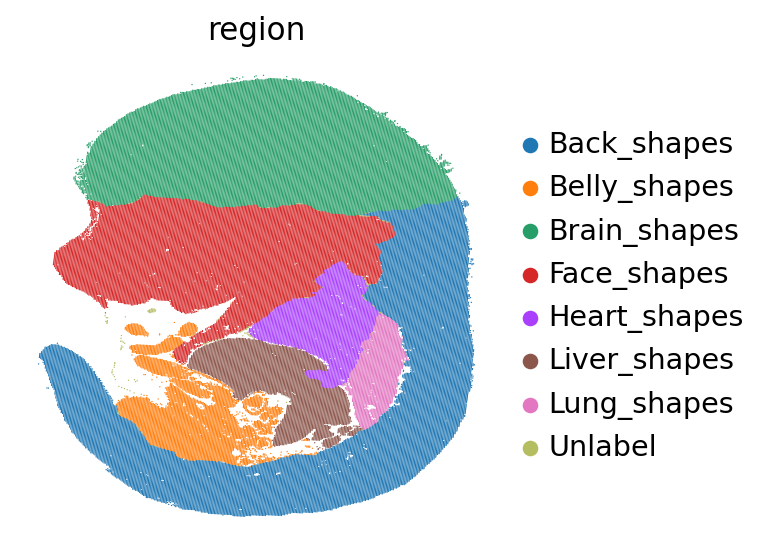

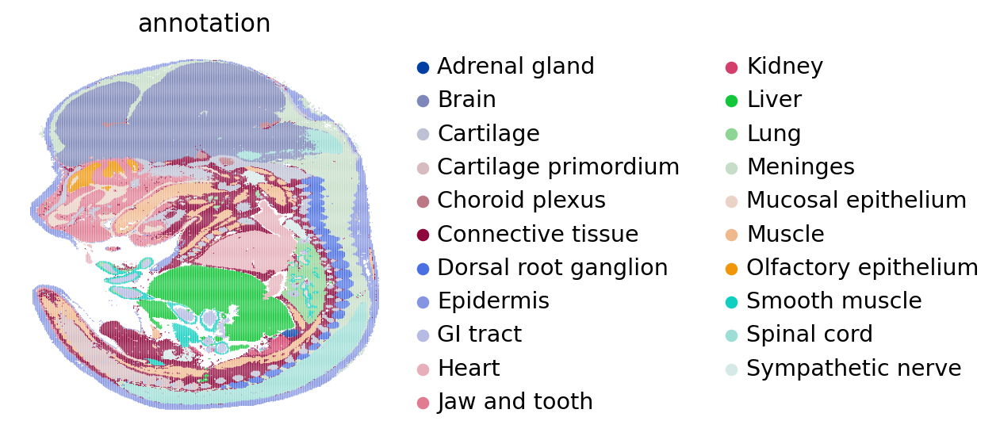

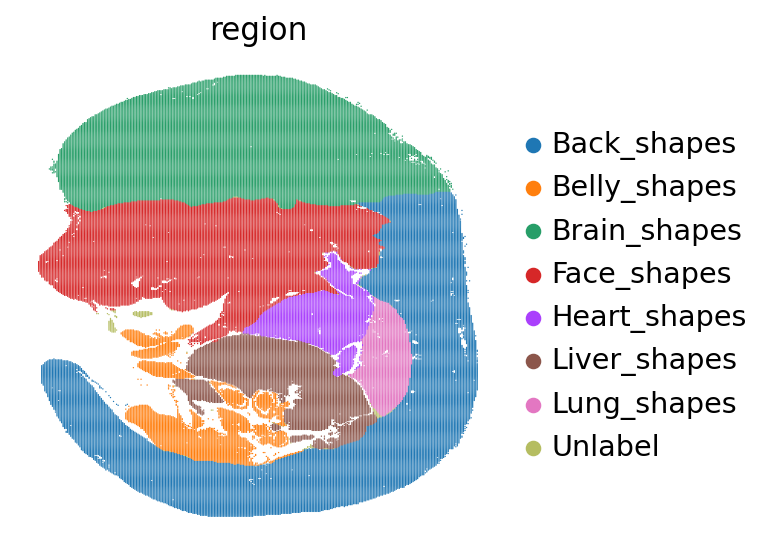

In [25]:
for adata_path in [visium_human_DLPFC, merfish_mouse_hypothalamic, stereo_mouse_embryo]:
    if 'visium' and 'DLPFC' in adata_path[0]:
        biology_meta = 'cell_type'
        topology_meta = 'layer_guess'
        spot_size = 6
    elif 'merfish' in adata_path[0]:
        biology_meta = 'Cell_class'
        topology_meta = 'region'
        spot_size = 12
    elif 'stereo' in adata_path[0]:
        biology_meta = 'annotation'
        topology_meta = 'region'
        spot_size = 3
    for i in range(len(adata_path)):
        for meta in [biology_meta, topology_meta]:
            tmp_adata = sc.read(adata_path[i])
            sc.pl.spatial(tmp_adata, color=meta, spot_size=spot_size, 
                        save=f'_{adata_path[i].split("/")[-1].split(".h5ad")[0]}_{meta}.png')

# Plot subsample datasets

/rd2/user/xiacr/SLAT/conda/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


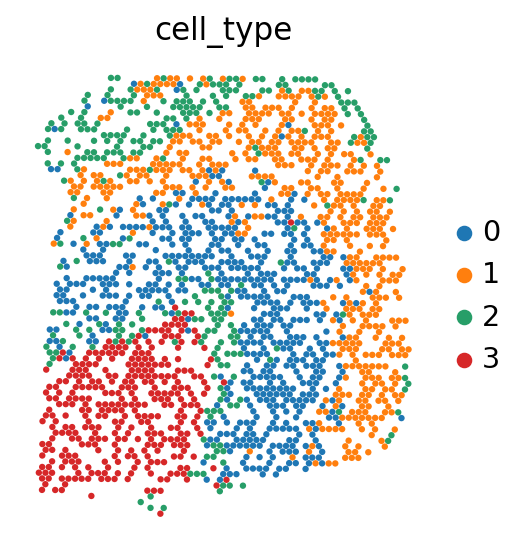

/rd2/user/xiacr/SLAT/conda/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


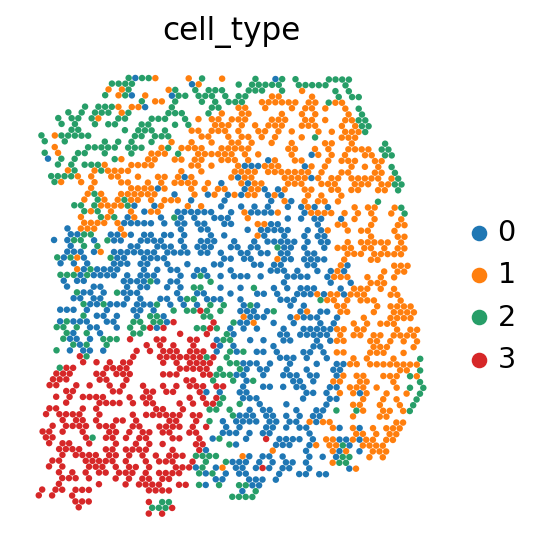

/rd2/user/xiacr/SLAT/conda/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


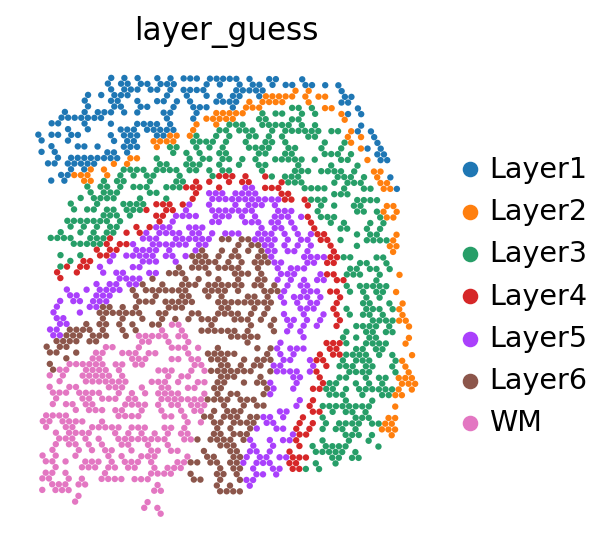

/rd2/user/xiacr/SLAT/conda/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


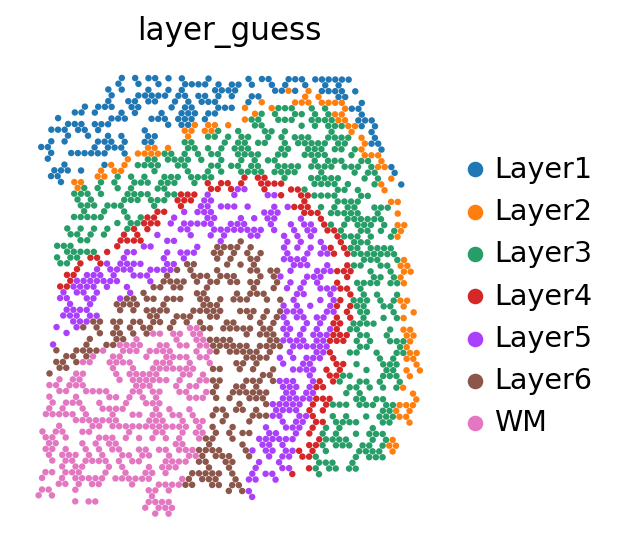

/rd2/user/xiacr/SLAT/conda/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


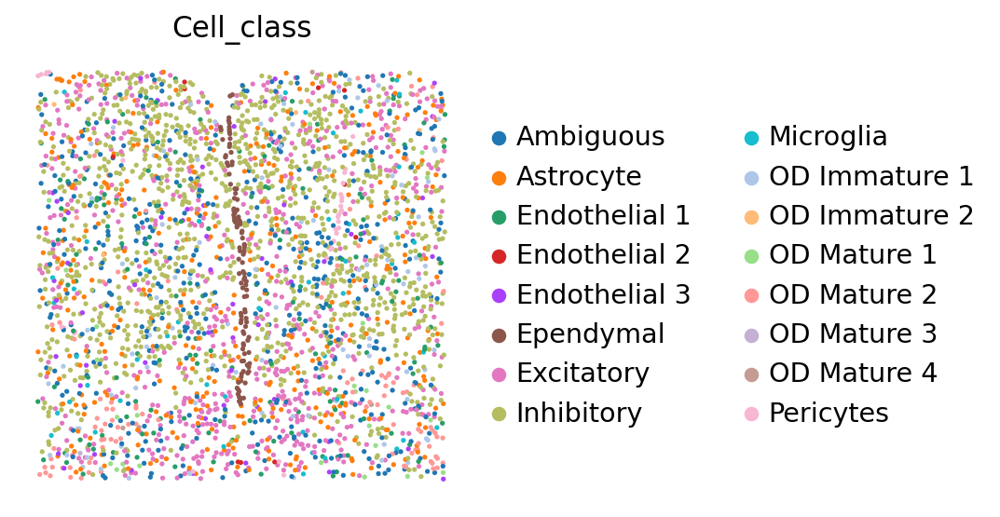

/rd2/user/xiacr/SLAT/conda/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


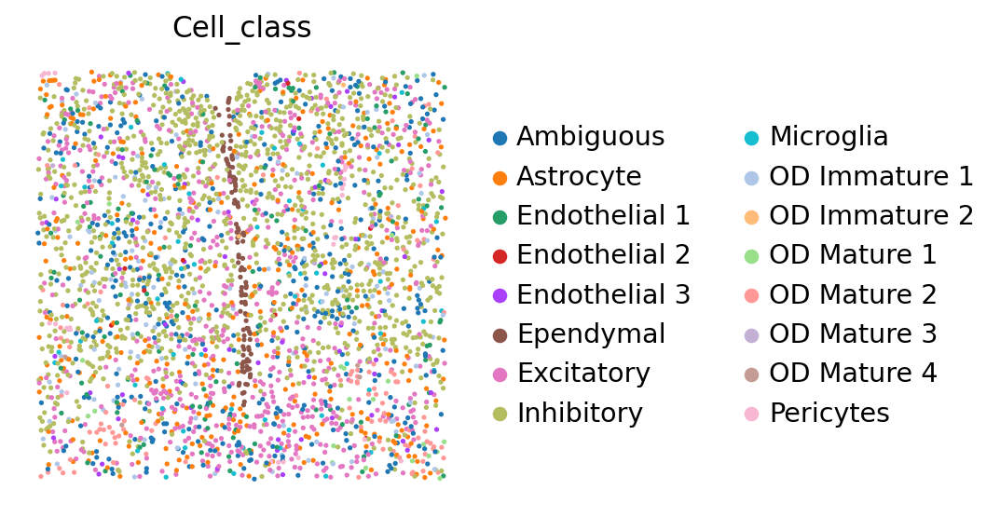

/rd2/user/xiacr/SLAT/conda/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


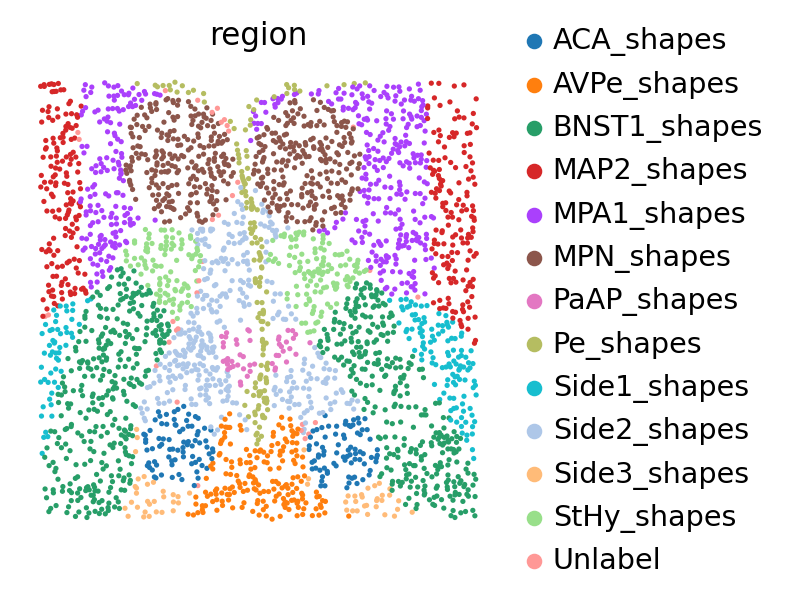

/rd2/user/xiacr/SLAT/conda/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


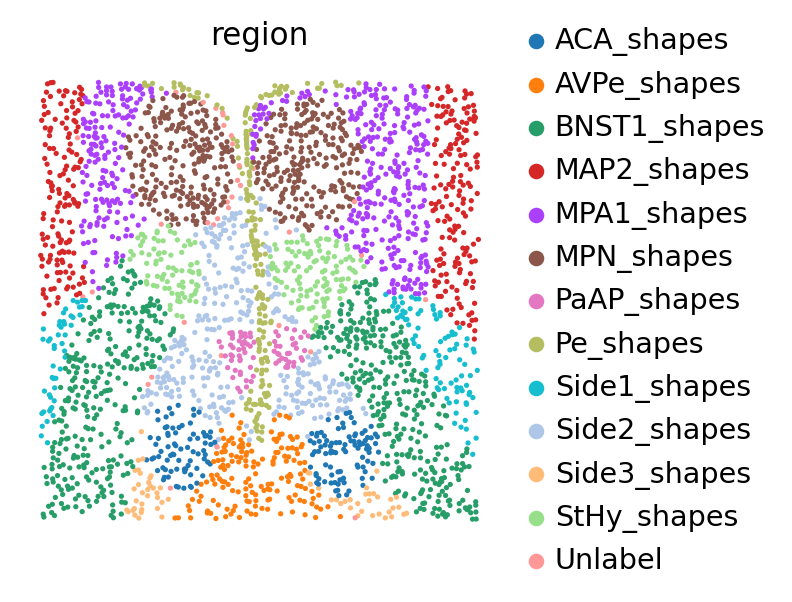

/rd2/user/xiacr/SLAT/conda/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


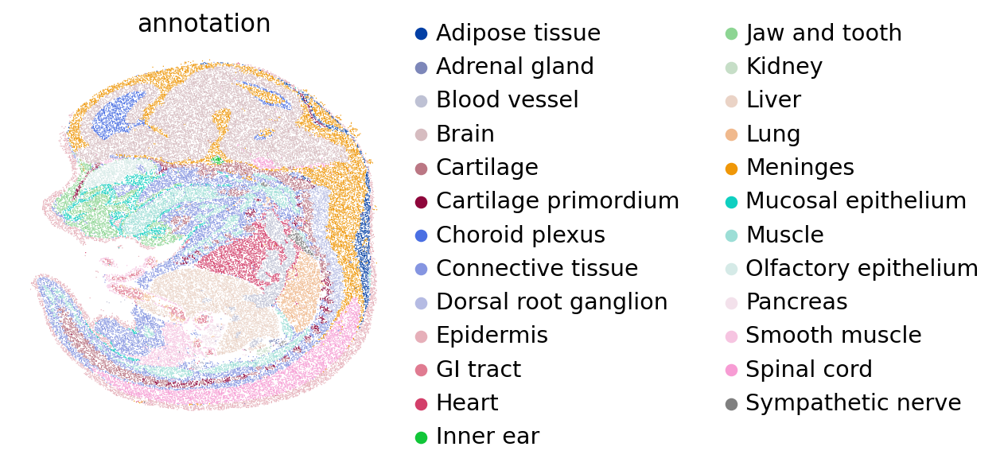

/rd2/user/xiacr/SLAT/conda/lib/python3.8/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


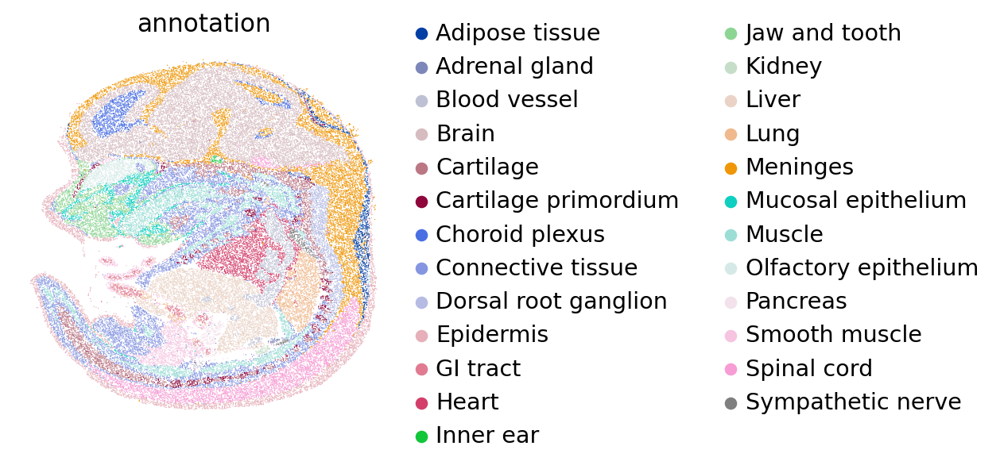

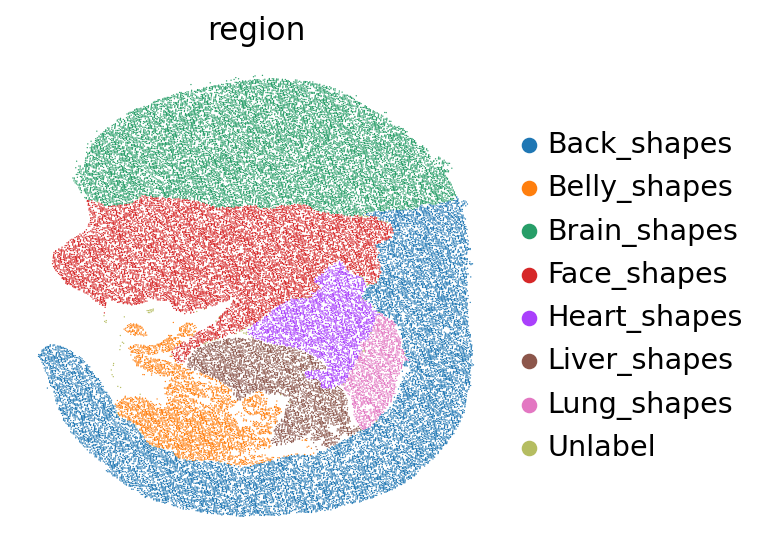

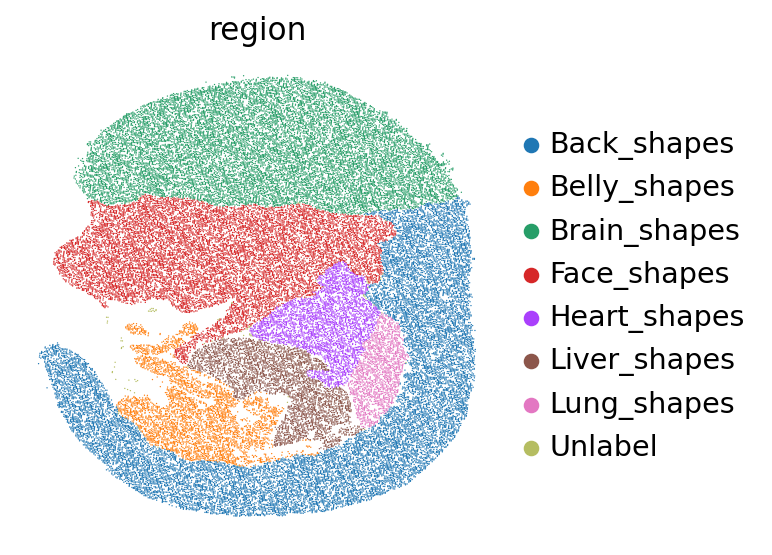

In [7]:
for adata_path in [visium_human_DLPFC, merfish_mouse_hypothalamic, stereo_mouse_embryo]:
    if 'visium' and 'DLPFC' in adata_path[0]:
        biology_meta = 'cell_type'
        topology_meta = 'layer_guess'
        spot_size = 6
    elif 'merfish' in adata_path[0]:
        biology_meta = 'Cell_class'
        topology_meta = 'region'
        spot_size = 12
    elif 'stereo' in adata_path[0]:
        biology_meta = 'annotation'
        topology_meta = 'region'
        spot_size = 3
    # Only split the first dataset
    for meta in [biology_meta, topology_meta]:
        adata = sc.read(adata_path[0])
        # split adata to two parts
        random_index = np.random.permutation(adata.shape[0])
        boundary = adata.shape[0] * 0.5
        adata_part0 = adata[random_index[:math.floor(boundary)],:]
        adata_part1 = adata[random_index[math.floor(boundary):],:]
        sc.pl.spatial(adata_part0, color=meta, spot_size=spot_size, 
                        save=f'_{adata_path[0].split("/")[-1].split(".h5ad")[0]}_{meta}_part1.png')
        sc.pl.spatial(adata_part1, color=meta, spot_size=spot_size, 
                        save=f'_{adata_path[0].split("/")[-1].split(".h5ad")[0]}_{meta}_part2.png')

# Plot 3D benchmark datasets
> We refer the code of PASTE at https://github.com/raphael-group/paste_reproducibility/blob/main/notebooks/DLPFC_pairwise.ipynb

In [9]:
sample_list = ["151507", "151508", "151509","151510", "151669", "151670","151671", "151672", "151673","151674", "151675", "151676"]
adatas = {sample:sc.read_h5ad('../../data/visium/DLPFC/all/{0}_preprocessed.h5'.format(sample)) for sample in sample_list}
sample_groups = [["151507", "151508", "151509","151510"],[ "151669", "151670","151671", "151672"],[ "151673","151674", "151675", "151676"]]
layer_groups = [[adatas[sample_groups[j][i]] for i in range(len(sample_groups[j]))] for j in range(len(sample_groups))]
layer_to_color_map = {'Layer{0}'.format(i+1):sns.color_palette()[i] for i in range(6)}
layer_to_color_map['WM'] = sns.color_palette()[6]

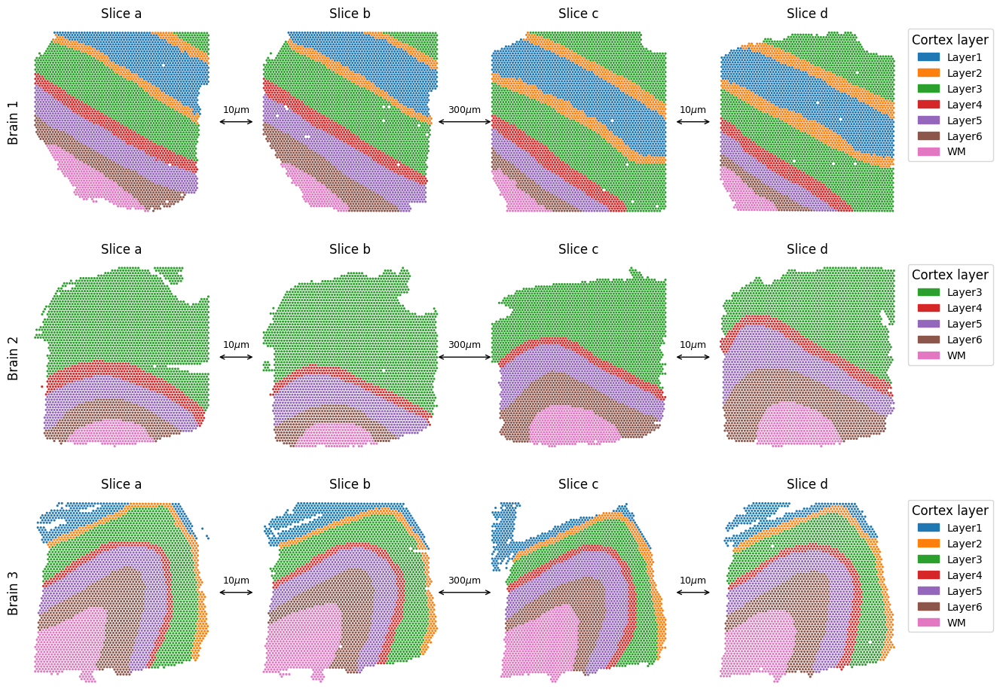

In [12]:
slice_map = {0:'a',1:'b',2:'c',3:'d'}
fig, axs = plt.subplots(3, 4,figsize=(15,11.5))
for j in range(len(layer_groups)):
    axs[j,0].text(-0.1, 0.5, 'Brain '+str(j+1),fontsize=12,rotation='vertical',transform = axs[j,0].transAxes,verticalalignment='center')
    for i in range(len(layer_groups[j])):
        adata = adatas[sample_list[j*4+i]]
        colors = list(adata.obs['layer_guess_reordered'].astype('str').map(layer_to_color_map))
        axs[j,i].scatter(layer_groups[j][i].obsm['spatial'][:,0],layer_groups[j][i].obsm['spatial'][:,1],linewidth=0,s=20, marker=".",color=colors)
        axs[j,i].set_title('Slice '+ slice_map[i],size=12)
        axs[j,i].invert_yaxis()
        axs[j,i].axis('off')
        if i<3:
            s = '300$\mu$m' if i==1 else "10$\mu$m"
            delta = 0.05 if i==1 else 0
            axs[j,i].annotate('',xy=(1-delta, 0.5), xytext=(1.2+delta, 0.5),xycoords=axs[j,i].transAxes,textcoords=axs[j,i].transAxes,arrowprops=dict(arrowstyle='<->',lw=1))
            axs[j,0].text(1.1, 0.55, s,fontsize=9,transform = axs[j,i].transAxes,horizontalalignment='center')
    axs[j,3].legend(handles=[mpatches.Patch(color=layer_to_color_map[adata.obs['layer_guess_reordered'].cat.categories[i]], label=adata.obs['layer_guess_reordered'].cat.categories[i]) for i in range(len(adata.obs['layer_guess_reordered'].cat.categories))],fontsize=10,title='Cortex layer',title_fontsize=12,bbox_to_anchor=(1, 1))
